# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


Загрузка и анализ данных

In [1]:
#  Дополнительные библиотеки Sentence-Transformers.
!pip install -q sentence-transformers

# Импорт библиотек:

In [2]:
# Импорт библиотек:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pickle
import glob
import nltk
import re
import tensorflow as tf
import keras_nlp
import sentence_transformers
import os

from nltk import word_tokenize
nltk.download('stopwords') # поддерживает удаление стоп-слов
nltk.download('wordnet') # проводит лемматизацию
! unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

from PIL import Image

from sklearn.model_selection import GroupShuffleSplit, cross_val_score
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler

from sentence_transformers import SentenceTransformer, util

from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras
from tqdm import notebook

#from warnings import simplefilter
#simplefilter(action='ignore', category=FutureWarning)

2024-08-09 09:51:58.441842: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered

2024-08-09 09:51:58.441976: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered

2024-08-09 09:51:58.616689: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[nltk_data] Downloading package stopwords to /usr/share/nltk_data...

[nltk_data]   Package stopwords is already up-to-date!

[nltk_data] Downloading package wordnet to /usr/share/nltk_data...

[nltk_data]   Package wordnet is already up-to-date!


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

  pid, fd = os.forkpty()


Archive:  /usr/share/nltk_data/corpora/wordnet.zip

   creating: /usr/share/nltk_data/corpora/wordnet/

  inflating: /usr/share/nltk_data/corpora/wordnet/lexnames  

  inflating: /usr/share/nltk_data/corpora/wordnet/data.verb  

  inflating: /usr/share/nltk_data/corpora/wordnet/index.adv  

  inflating: /usr/share/nltk_data/corpora/wordnet/adv.exc  

  inflating: /usr/share/nltk_data/corpora/wordnet/index.verb  

  inflating: /usr/share/nltk_data/corpora/wordnet/cntlist.rev  

  inflating: /usr/share/nltk_data/corpora/wordnet/data.adj  

  inflating: /usr/share/nltk_data/corpora/wordnet/index.adj  

  inflating: /usr/share/nltk_data/corpora/wordnet/LICENSE  

  inflating: /usr/share/nltk_data/corpora/wordnet/citation.bib  

  inflating: /usr/share/nltk_data/corpora/wordnet/noun.exc  

  inflating: /usr/share/nltk_data/corpora/wordnet/verb.exc  

  inflating: /usr/share/nltk_data/corpora/wordnet/README  

  inflating: /usr/share/nltk_data/corpora/wordnet/index.sense  

  inflating: /usr

In [3]:
DATA_PATH = '/kaggle/working/to_upload'
SEED = 42
BLACKLIST = ['teenage', 'baby', 'child', 'teenager', 'girl', 'boy', 'kid']

np.random.seed(SEED)
tf.random.set_seed(SEED)

In [4]:
# Загрузим данные:
!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -q dsplus_integrated_project_4.zip

In [5]:
def read_df(path=DATA_PATH) -> pd.DataFrame:
    
    df_train = pd.read_csv(Path(DATA_PATH, 'train_dataset.csv'))
    df_crowd = pd.read_csv(Path(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(Path(DATA_PATH, 'test_queries.csv'), index_col=[0], sep='|')
    df_images = pd.read_csv(Path(DATA_PATH, 'test_images.csv'), sep='|')
    
    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

In [6]:
# Обучающий датасет:

df_train.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 5822 entries, 0 to 5821

Data columns (total 3 columns):

 #   Column      Non-Null Count  Dtype 

---  ------      --------------  ----- 

 0   image       5822 non-null   object

 1   query_id    5822 non-null   object

 2   query_text  5822 non-null   object

dtypes: object(3)

memory usage: 136.6+ KB


- Обучающий датасет содержит 5822 записи и 3 колонки
- В обучающем датасете представлены запросы, и несколько изображений, из которых только одно будет соответвовать запросу. Подходящий запрос сожержит в себе имя изображения. Порядковый номер запроса в этом датасете всегда равен 2.
- Описание столбцов соответствует документации. Пропусков нет

In [8]:
# Краудсорсинг датасет:

df_crowd.sample(10)

,image,query_id,share_pos,count_pos,count_neg
46396,700884207_d3ec546494.jpg,2450299735_62c095f40e.jpg#2,0.000000,0,3
13591,2533424347_cf2f84872b.jpg,3310067561_b92017acab.jpg#2,0.000000,0,3
34468,3462454965_a481809cea.jpg,2607462776_78e639d891.jpg#2,0.000000,0,3
44167,493621130_152bdd4e91.jpg,533483374_86c5d4c13e.jpg#2,0.000000,0,3
19052,2860872588_f2c7b30e1a.jpg,166507476_9be5b9852a.jpg#2,0.000000,0,3
43639,473220329_819a913bbb.jpg,300550441_f44ec3701a.jpg#2,0.666667,2,1
34363,3459156091_c1879ebe28.jpg,2718024196_3ff660416a.jpg#2,0.000000,0,3
37232,3549583146_3e8bb2f7e9.jpg,3503689049_63212220be.jpg#2,0.000000,0,3
30650,3316725440_9ccd9b5417.jpg,2554081584_233bdf289a.jpg#2,0.000000,0,3
8530,2265096094_8cc34d669c.jpg,150387174_24825cf871.jpg#2,0.000000,0,3


In [9]:
df_crowd.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 47830 entries, 0 to 47829

Data columns (total 5 columns):

 #   Column     Non-Null Count  Dtype  

---  ------     --------------  -----  

 0   image      47830 non-null  object 

 1   query_id   47830 non-null  object 

 2   share_pos  47830 non-null  float64

 3   count_pos  47830 non-null  int64  

 4   count_neg  47830 non-null  int64  

dtypes: float64(1), int64(2), object(2)

memory usage: 1.8+ MB


- Краудсорсинг датасет содержит 47830 записи и 5 колонок
- Порядковый номер запроса также всегда 2
- Описание столбцов соответствует документации

In [10]:
# Датасет с экспертными оценками:

df_expert.sample(10)

,image,query_id,first,second,third
4881,3677318686_b018862bb7.jpg,1446053356_a924b4893f.jpg#2,1,1,1
3749,3315616181_15dd137e27.jpg,352382023_7605223d1c.jpg#2,1,1,1
81,1174629344_a2e1a2bdbf.jpg,1329832826_432538d331.jpg#2,2,2,2
5194,436009777_440c7679a1.jpg,2354540393_a149722680.jpg#2,1,1,1
5778,917574521_74fab68514.jpg,2100816230_ff866fb352.jpg#2,1,1,2
3058,3116769029_f5a76f04ba.jpg,2894217628_f1a4153dca.jpg#2,1,1,1
1472,2461616306_3ee7ac1b4b.jpg,3433982387_3fa993cf5a.jpg#2,1,1,1
1015,2229179070_dc8ea8582e.jpg,3244747165_17028936e0.jpg#2,1,1,1
4589,3569406219_f37ebf7b92.jpg,3197981073_3156963446.jpg#2,1,2,2
819,2124040721_bffc0a091a.jpg,754852108_72f80d421f.jpg#2,2,2,2


In [11]:
df_expert.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 5822 entries, 0 to 5821

Data columns (total 5 columns):

 #   Column    Non-Null Count  Dtype 

---  ------    --------------  ----- 

 0   image     5822 non-null   object

 1   query_id  5822 non-null   object

 2   first     5822 non-null   int64 

 3   second    5822 non-null   int64 

 4   third     5822 non-null   int64 

dtypes: int64(3), object(2)

memory usage: 227.5+ KB


- Датасет с с экспертными оценками содержит 5822 записи и 5 колонок
- Порядковый номер запроса также всегда 2. Таблица с оценками экспертов содержит столько же строк, как и обучающий датасет, то есть оценки проводились на этом датасете
- Описание столбцов соответствует документации. Пропусков нет

In [12]:
# Датасет с тестовыми запросами:

df_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [13]:
df_queries.info()

<class 'pandas.core.frame.DataFrame'>

Index: 500 entries, 0 to 499

Data columns (total 3 columns):

 #   Column      Non-Null Count  Dtype 

---  ------      --------------  ----- 

 0   query_id    500 non-null    object

 1   query_text  500 non-null    object

 2   image       500 non-null    object

dtypes: object(3)

memory usage: 15.6+ KB


- Датасет с тестовыми запросами содержит 500 записей и 3 колонки
- В датасете представлены имена изображений и соответсвующие им тексты запросов, где `query_id` содержит в себе имя соответвующего изображения плюс порядковый номер запроса.
- Описание столбцов соответствует документации. Пропусков нет

In [14]:
# Датасет с изображениями:

df_images.head()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [15]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 100 entries, 0 to 99

Data columns (total 1 columns):

 #   Column  Non-Null Count  Dtype 

---  ------  --------------  ----- 

 0   image   100 non-null    object

dtypes: object(1)

memory usage: 928.0+ bytes


- Датасет с тестовыми запросами содержит 100 записей и 2 колонки
- Описание столбцов соответствует документации. Пропусков нет

In [16]:
# Проверим количество уникальных изображений в обучающем и тестовом датасетах:

print('Количество уникальных фото на трейне:', len(df_train['image'].unique()))
print('Количество уникальных фото на тесте:', len(df_queries['image'].unique()))

Количество уникальных фото на трейне: 1000

Количество уникальных фото на тесте: 100


In [17]:
print('Количество уникальных запросов на тесте:', df_queries.drop_duplicates().shape[0])

Количество уникальных запросов на тесте: 500


In [18]:
# Посмотрим на количество оценок в экспертном и краудсорсинговом датасетах:

print('Количество уникальных сочетаний фото-текст оцененных экспертами:', df_expert.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', df_crowd.drop_duplicates().shape[0])

Количество уникальных сочетаний фото-текст оцененных экспертами: 5822

Количество уникальных сочетаний фото-текст оцененных людьми: 47830


In [19]:
# Проверим соответствие текстовых описаний друг другу в обучающем и тестовом датасетах:

print('Уникальных текстовых описаний в трейне:', len(set(df_train['query_text'])))
print('Уникальных текстовых описаний в тесте:', len(set(df_queries['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(df_train['query_text']) & set(df_queries['query_text'])))

Уникальных текстовых описаний в трейне: 977

Уникальных текстовых описаний в тесте: 500

Уникальных текстовых описаний которые есть в обоих наборах: 0


In [20]:
# Проверим не совпадают ли изображения в обучающем и тестовом датасетах:

print('Уникальных изображений в обучающем датасете:', len(set(df_train['image'])))
print('Уникальных изображений в тестовом датасете:', len(set(df_queries['image'])))
print('Уникальных изображений, которые есть в обоих таблицах:', len(set(df_train['image']) & set(df_queries['image'])))

Уникальных изображений в обучающем датасете: 1000

Уникальных изображений в тестовом датасете: 100

Уникальных изображений, которые есть в обоих таблицах: 0


Кол-во изображений в обучающем датасете: 1000


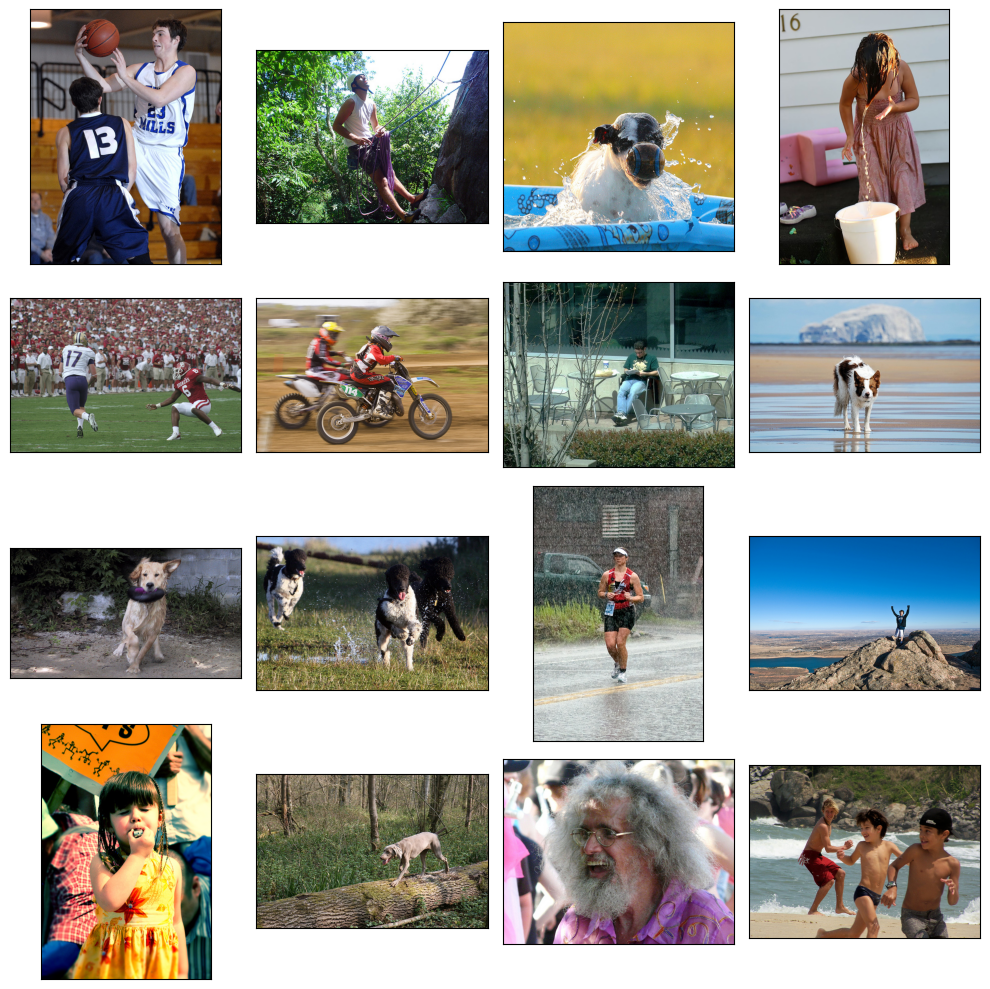

In [21]:
# Посмотрим на изображения, входящими в датасеты.

samples_train = list(df_train['image'].sample(16))


fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(DATA_PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
print('Кол-во изображений в обучающем датасете:', len(set(df_train['image'])))

Кол-во изображений в тестовом датасете: 100


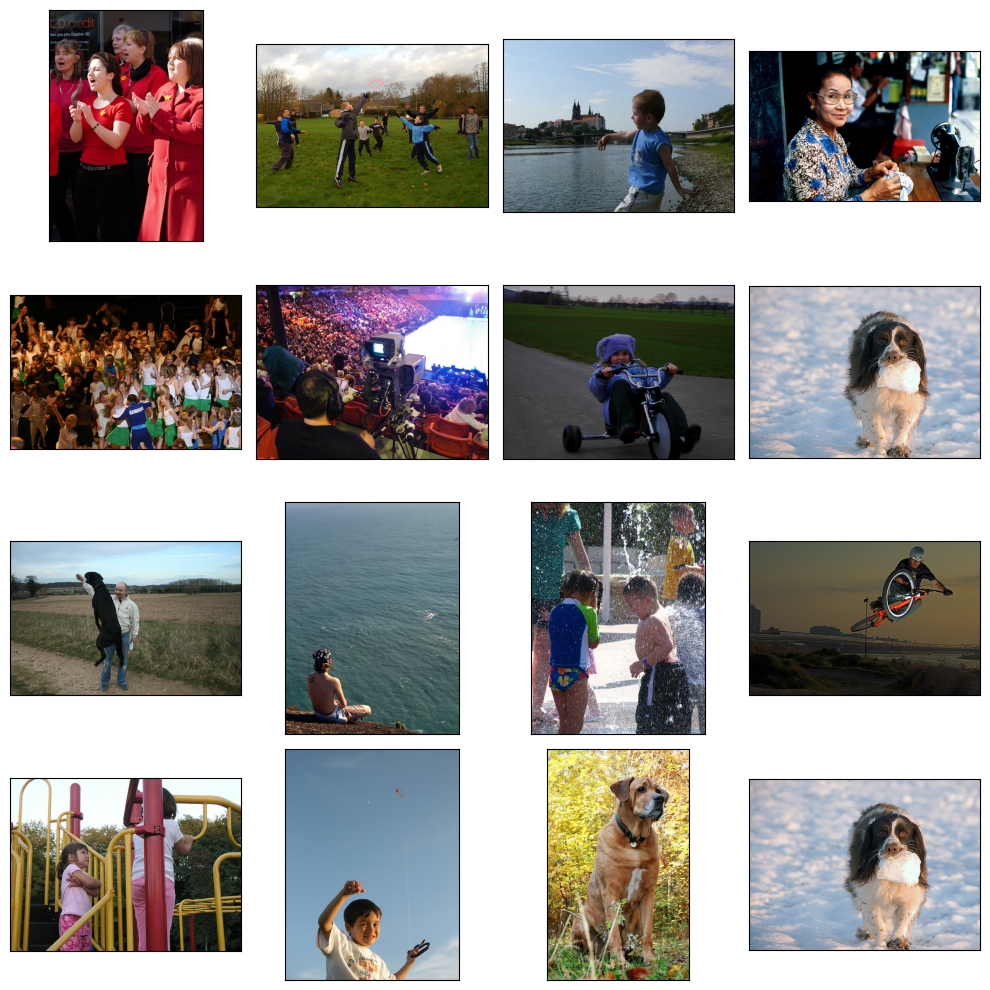

In [22]:
samples_test = list(df_queries['image'].sample(16))
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(DATA_PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
print('Кол-во изображений в тестовом датасете:', len(set(df_queries['image'])))

Изображения содержат в себе фотографии взрослых людей, детей, животных(в основном собак).

***Выводы:***
   
- Данный набор данных является частью датасета Flickr30k. В нашем распоряжении 1000 картинок в тренировочном и 100 в тестовом датасете. Есть предобработанные файлы с сочетаниями описаний и картинок, для обоих датасетов.
- Для тренировочного набора при этом есть как экспертные оценки соответствия 5822 шт. так и оценки выполненные на краудфайдинговой платформе обычными людьми - 47830 шт, они частично совпадают.
- Пересечений между наборами данных для тренировочного и тестового наборов не обнаружено.
- В тренеровочном датасете использованы только с порядковым номер запроса описания картинок - #2, в тестовом датасете же к каждой картинке даны по 5 описаний.

**Аггрегация оценок**

Если все оценки разные - усредняем оценку и приводим к диапазону [0,1], если есть несколько одинаковых оценок - голосуем большинством.

In [23]:
# Аггрегируем экспертную оценку усреднением ответов и сведением к диапазону [0,1]:

def expert_aggregate(row) -> object:

    #если оценки разные усредняем:
    if row['first'] != row['second'] != row['third']: 
        row['expert_score'] = (row['first'] + row['second'] + row['third'] - 3) / 3 / 3
    
    #если есть одинаковые оценки - аггрегируем голосованием:
    else: 
        row['expert_score'] = (max(set([row['first'], row['second'], row['third']]), key = [row['first'], row['second'], row['third']].count) - 1) / 3

    return row

df_expert = df_expert.apply(expert_aggregate, axis=1)

Поскольку только 2329 пар картинка-текст имеют оценки и людей и экспертов мы объединим оба набора с оценками с флагом outer. Таким образом у части пар будут оценки экспертов (как более надёжные), для некоторых оценки людей, для остальных смешанная оценка. Далее мы объединим оценки.

In [24]:
# Аггрегируем оценки людей и экспертов:

df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

def score_aggregate(row) -> object:

    if np.isnan(row['expert_score']):
        row['score'] = row['share_pos']
    elif np.isnan(row['share_pos']):
        row['score'] = row['expert_score']
    else:
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3
        
    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

In [25]:
# Проверяем результат:

display(df_scores['score'].isna().value_counts())
df_scores['score'].describe()

score
False    51323
Name: count, dtype: int64

count    51323.000000
mean         0.075967
std          0.208417
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: score, dtype: float64

Добавляем цели.

In [26]:
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [27]:
to_fill = df_train[df_train['query_text'].notna()]

Заполняем пропуски в описании после добавления оценок людей.

In [28]:
# Заполняем пропуски текстов в тренировочном наборе данных

def fill_text(row) -> object:

    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]

    return row

df_train = df_train.apply(fill_text, axis=1)

In [29]:
# Проверяем:

df_train.head(10)

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.000000
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .,0.000000
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,A young boy holds onto a blue handle on a pier .,0.000000
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.000000
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.000000
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,A woman wearing a white glove peers over the c...,0.000000
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,A man taking a picture with a silver camera .,0.000000
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,"A woman crosses the street near a man , who is...",0.333333
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,A man wearing a black shirt and baseball cap s...,0.000000
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,A woman wears sunglasses and a black coat as s...,0.000000


In [30]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 51323 entries, 0 to 51322

Data columns (total 4 columns):

 #   Column      Non-Null Count  Dtype  

---  ------      --------------  -----  

 0   image       51323 non-null  object 

 1   query_id    51323 non-null  object 

 2   query_text  50214 non-null  object 

 3   score       51323 non-null  float64

dtypes: float64(1), object(3)

memory usage: 1.6+ MB


Для части query_id нет описаний, поэтому их отбросим.

In [31]:
df_train.dropna(inplace=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>

Index: 50214 entries, 0 to 51322

Data columns (total 4 columns):

 #   Column      Non-Null Count  Dtype  

---  ------      --------------  -----  

 0   image       50214 non-null  object 

 1   query_id    50214 non-null  object 

 2   query_text  50214 non-null  object 

 3   score       50214 non-null  float64

dtypes: float64(1), object(3)

memory usage: 1.9+ MB


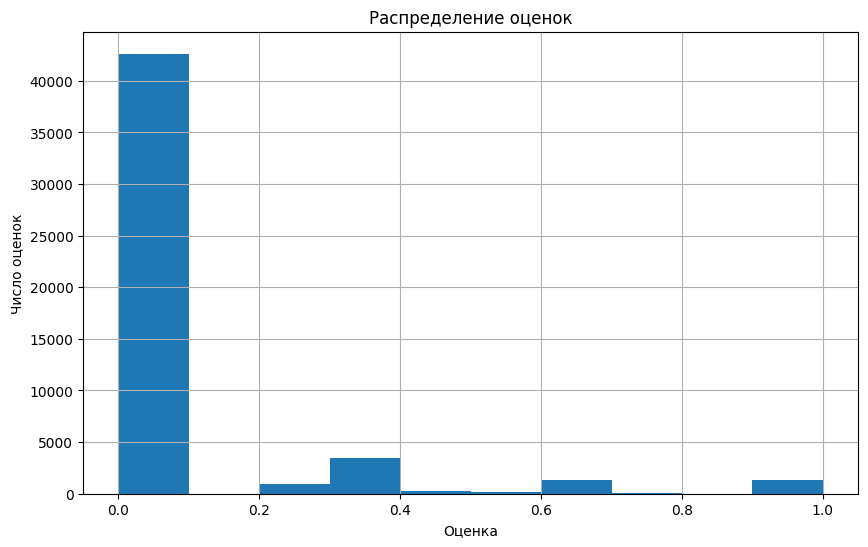

In [32]:
plt.figure(figsize=(10,6))
plt.hist(df_train['score'])
plt.title('Распределение оценок')
plt.xlabel('Оценка')
plt.ylabel('Число оценок')
plt.grid(True);

В получившемся датасете преобладают нулевые оценки.

***Вывод:***
- Объединили оценки с обучающим набором данных
- Заполнили пропуски, удалили NaN'ы.
- Цели готовы,

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для избавления от нелегального контента используем текстовые описания файлов.

Объявим список слов для поиска нелегального контента - BLACKLIST .

Очистим, токенизируем и лемматизируем текст, чтобы было легче искать запросы связанные с детьми. Выберем в обучающем наборе фото подлежащие блокировке.

In [33]:
# Очищаем текст и превращаем в список лемм:

lemmatize = nltk.WordNetLemmatizer()

def get_lemmas(text) -> list:

    text = re.sub('[^a-zA-Z]', ' ', text).lower() # удаляем неалфавитные символы, приводим к нижнему регистру
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatize.lemmatize(word) for word in text] # лемматирзируем слова

    return text

# Отмечаем тексты для блокирования:

def cleaning(row) -> object:

    text = get_lemmas(row['query_text'])
    if [i for i in text if i in BLACKLIST]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [34]:
%time 
df_train = df_train.apply(cleaning, axis=1)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs

Wall time: 6.68 µs


In [35]:
# Просмотрим на примеры заблокированных текстов:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['A young child wearing a mask at Ivars .'

 'A boy , wearing a baseball cap , jumps in the air near some steps .'

 'A large white dog , a girl , and a police car in a driveway and an SUV in a garage .'

 'two girls dress up for halloween .' 'a girl paints the road .'

 'A child running with a snowboard on a snow covered surface .'

 'A woman posing with a statue alongside a group of boys'

 'A child is preparing to slide down a piece of playground equipment .'

 'A boy runs to a baseball base .'

 'Boys in life jackets on a watercraft .']


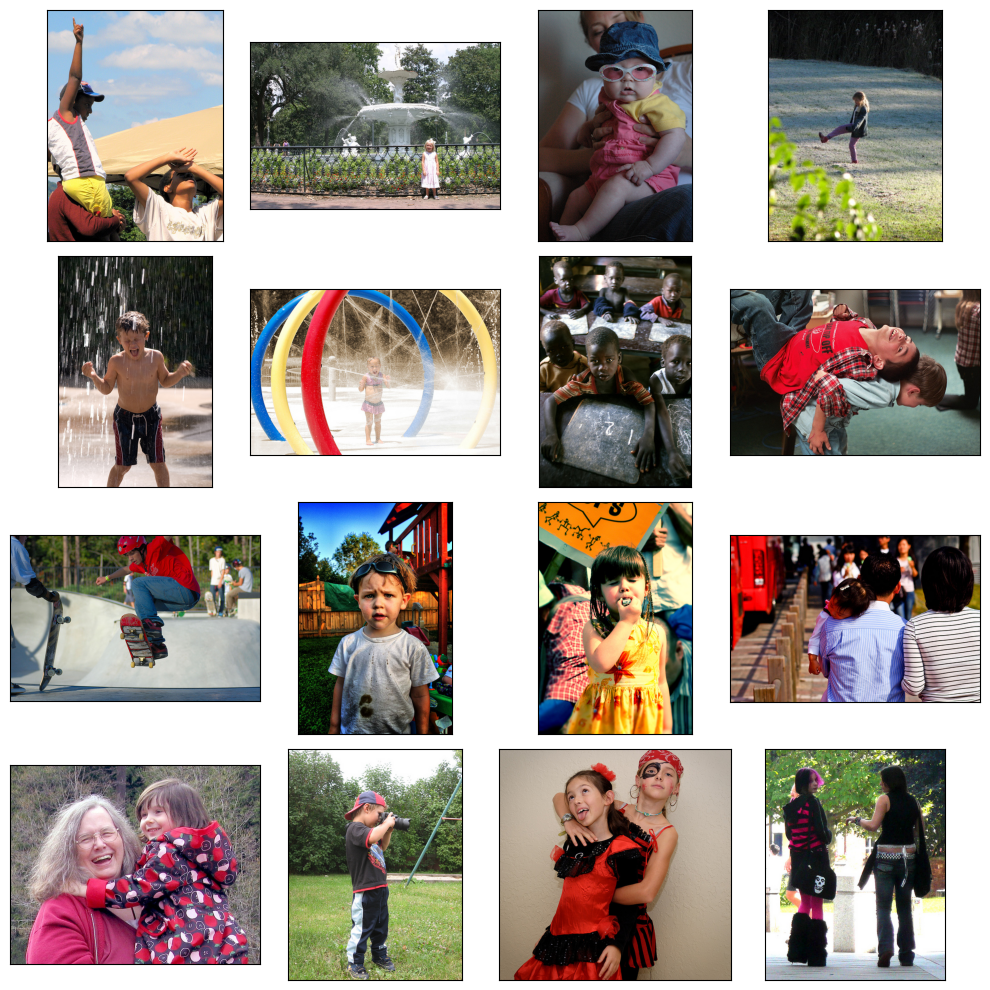

In [36]:
# Выведем случайные картинки которые попали под правило блокировки. 
# Для поиска картинок воспользуемся тем что поле query_id таблицы df_train содержит закодированное имя картинки соответствующей этому описанию.

samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(DATA_PATH, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Фотографии отмечены верно)

In [ ]:
# Удаляем строки с фото с детьми из набора данных:

#df_train.drop(df_train[df_train['to_block'] == 1].index, inplace=True, errors='ignore')
#df_train.drop(columns='to_block', inplace=True, errors='ignore')
#df_train.reset_index(inplace=True, drop=True)

In [37]:
balacklist_imgs = df_train[df_train['to_block'] == 1]['query_id'].str[:-2].unique()

df_train = df_train[~df_train['image'].isin(balacklist_imgs)][['image', 'query_id', 'query_text', 'score']]

df_train.reset_index(inplace=True, drop=True)

In [38]:
# Проверяем:
df_train.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 36105 entries, 0 to 36104

Data columns (total 4 columns):

 #   Column      Non-Null Count  Dtype  

---  ------      --------------  -----  

 0   image       36105 non-null  object 

 1   query_id    36105 non-null  object 

 2   query_text  36105 non-null  object 

 3   score       36105 non-null  float64

dtypes: float64(1), object(3)

memory usage: 1.1+ MB


***Вывод:***  
Проверили данные и исключили из обучения все описания содержащие запрещённую информацию.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-50, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [39]:
# Загрузчик данных для обучения:

def load_train(path=DATA_PATH) -> ImageDataGenerator:
    
    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        shuffle=False,
        seed=SEED)
    
    return train_gen_flow

Found 36105 validated image filenames.


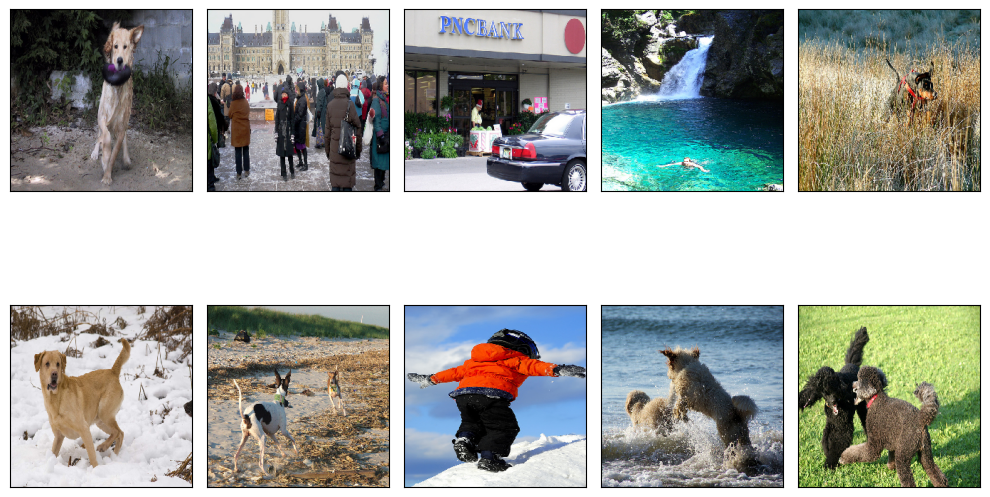

In [40]:
flow_train = load_train()
features, target = next(flow_train)

fig = plt.figure(figsize=(10,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

В набор попали фотографии с детьми, т.к. в строках с низкой оценкой есть сравнения с такими фотографиями.

In [41]:
# Задаём архитектуру сети:

def create_model(input_shape=(256, 256, 3)):
    
    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    
    return model

In [42]:
# Переводим данные в вектор:

def vectorize_pictures(model, train_data):
    predictions = model.predict(train_data)
    return predictions

In [43]:
%%time

pict_embeds = vectorize_pictures(create_model(), load_train())


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Found 36105 validated image filenames.


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

  self._warn_if_super_not_called()


   4/2257 ━━━━━━━━━━━━━━━━━━━━ 2:02 54ms/step


I0000 00:00:1723197326.795455     148 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2257/2257 ━━━━━━━━━━━━━━━━━━━━ 160s 67ms/step

CPU times: user 3min 7s, sys: 7.48 s, total: 3min 15s

Wall time: 2min 44s


In [44]:
pict_embeds.shape

(36105, 2048)

***Вывод:***  

Векторизированные изображения получены.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [45]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

Attaching 'model.safetensors' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'model.safetensors.index.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'metadata.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'metadata.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'config.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'config.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'model.weights.h5' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...


In [46]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

Attaching 'model.safetensors' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'model.safetensors.index.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'metadata.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'metadata.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'preprocessor.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'tokenizer.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'tokenizer.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...

Attaching 'assets/tokenizer/vocabulary.txt' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...


In [47]:
# Преобразуем тексты в словарь токенов, масок и паддингов:

def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:
    
    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
        
            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]
            
            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types, 
                    'padding_mask' : mask}
                    
            batch_embeddings = model.predict(batch, verbose=verbose)
            
            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):
        
            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]
            
            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types, 
                    'padding_mask' : mask}
                    
            batch_embeddings = model.predict(batch, verbose=verbose)
            
            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

In [48]:
text = list(df_train['query_text'])

In [49]:
%%time

text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/1129 [00:00<?, ?it/s]

W0000 00:00:1723197505.656335     149 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update

W0000 00:00:1723198841.334625     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


CPU times: user 21min 41s, sys: 45.3 s, total: 22min 26s

Wall time: 22min 22s


In [50]:
text_embeds.shape

(36105, 768)

***Вывод:***  

Загрузили модель BERT base cased EN и получили эмбеддинги наших текстов. 

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [51]:
X = np.concatenate((pict_embeds, text_embeds), axis=1)
X.shape

(36105, 2816)

In [52]:
y = np.array(df_train['score'])
y.shape

(36105,)

In [53]:
with open('X.pickle', 'wb') as f:
    pickle.dump(X, f)

with open('y.pickle', 'wb') as f:
    pickle.dump(y, f)

In [54]:
'''with open('X.pickle', 'rb') as f:
    X = pickle.load(f)
with open('y.pickle', 'rb') as f:
    y = pickle.load(f)
print(X.shape)
print(y.shape)'''

"with open('X.pickle', 'rb') as f:\n    X = pickle.load(f)\nwith open('y.pickle', 'rb') as f:\n    y = pickle.load(f)\nprint(X.shape)\nprint(y.shape)"

***Вывод:***  

Признаки и цели готовы

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [55]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=SEED)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [56]:
X_train, X_test = X[train_indices], X[test_indices]

In [57]:
y_train, y_test = y[train_indices], y[test_indices]

In [58]:
# Масштабируем данные:

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

**LinearRegression:**

Так как у нас задача регрессии, воспользуемся метрикой RMSE. Чем ближе значение к нулю, тем лучше качество. Преимущество выбора данной метрики в том, что она измеряется в той же единице, что и целевая переменная.

In [59]:
model_lr = LinearRegression(n_jobs=-1)
model_lr.fit(X_train, y_train)
pred = model_lr.predict(X_test)

rmse_lr = round(mean_squared_error(y_test, pred, squared=False),3)

print('RMSE:', rmse_lr)

RMSE: 0.212


**CatBoost**

In [60]:
model_cb = CatBoostRegressor(depth=7, iterations=1000, random_state=42, learning_rate=0.0001, verbose=200)

model_cb.fit(X_train, y_train)
pred = model_cb.predict(X_test)
rmse_cb = round(mean_squared_error(y_test, pred, squared=False),3)
print('RMSE:', rmse_cb)

0:	learn: 0.2214044	total: 674ms	remaining: 11m 13s

200:	learn: 0.2212380	total: 1m 34s	remaining: 6m 14s

400:	learn: 0.2210730	total: 3m 8s	remaining: 4m 41s

600:	learn: 0.2209136	total: 4m 41s	remaining: 3m 7s

800:	learn: 0.2207566	total: 6m 14s	remaining: 1m 32s

999:	learn: 0.2206034	total: 7m 46s	remaining: 0us

RMSE: 0.216


***NeuralNetwork:***  

Создадим трёхслоёную нейронную сеть.

In [61]:
X_train.shape

(24980, 2816)

In [62]:
NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

NN.build()

NN.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 2816)           │     7,932,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2816)           │        11,264 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       721,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,666,369 (33.06 MB)

 Trainable params: 8,660,225 (33.04 MB)

 Non-trainable params: 6,144 (24.00 KB)

In [63]:
NN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32, epochs=10,
    verbose=2, shuffle=True
    )


Epoch 1/10


W0000 00:00:1723199329.675508     151 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update

W0000 00:00:1723199333.558387     150 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update

W0000 00:00:1723199334.399570     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


781/781 - 8s - 10ms/step - loss: 0.2580 - root_mean_squared_error: 0.5080 - val_loss: 0.1352 - val_root_mean_squared_error: 0.3677

Epoch 2/10


W0000 00:00:1723199335.240472     148 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


781/781 - 3s - 4ms/step - loss: 0.0815 - root_mean_squared_error: 0.2854 - val_loss: 0.0897 - val_root_mean_squared_error: 0.2995

Epoch 3/10

781/781 - 3s - 4ms/step - loss: 0.0495 - root_mean_squared_error: 0.2224 - val_loss: 0.0776 - val_root_mean_squared_error: 0.2785

Epoch 4/10

781/781 - 3s - 4ms/step - loss: 0.0401 - root_mean_squared_error: 0.2003 - val_loss: 0.0769 - val_root_mean_squared_error: 0.2773

Epoch 5/10

781/781 - 3s - 4ms/step - loss: 0.0371 - root_mean_squared_error: 0.1926 - val_loss: 0.0711 - val_root_mean_squared_error: 0.2666

Epoch 6/10

781/781 - 3s - 4ms/step - loss: 0.0377 - root_mean_squared_error: 0.1940 - val_loss: 0.0625 - val_root_mean_squared_error: 0.2501

Epoch 7/10

781/781 - 3s - 4ms/step - loss: 0.0366 - root_mean_squared_error: 0.1914 - val_loss: 0.0644 - val_root_mean_squared_error: 0.2538

Epoch 8/10

781/781 - 3s - 4ms/step - loss: 0.0370 - root_mean_squared_error: 0.1923 - val_loss: 0.0652 - val_root_mean_squared_error: 0.2554

Epoch 9/10


***Вывод:***  

Все модели показали схожие результаты. Нейроная сеть, пусть и чуть хуже, зато быстрее работает. Для тестирования модели будем использовать NeuralNetwork.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [64]:
# Создаем загрузчик тестовых изображений:

def load_test(path=DATA_PATH) -> ImageDataGenerator:
    
    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_images,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        shuffle=False,
        seed=SEED)
    
    return train_gen_flow

In [65]:
%%time
# Получаем эмбеддинги тестовых картинок:

pict_embeds_test = vectorize_pictures(create_model(), load_test())
pict_embeds_test.shape

Found 100 validated image filenames.


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step

CPU times: user 11 s, sys: 257 ms, total: 11.3 s

Wall time: 11.1 s


(100, 2048)

Функция, принимающая на вход текстовое описание и возвращающую 5 изображений с максимальной предсказанной оценкой схожести:

In [66]:
def get_picture(text) -> None:

     # Проверяем легальность запроса, получаем наиболее похожие изображения, если описание среди оригинальных изображений - добавляем последнее верное'''
    
    if [i for i in get_lemmas(text) if i in BLACKLIST]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых изображений с эмбеддингом текста
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам изображений
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с изображениями
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок
        
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих изображений
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(DATA_PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальное изображение
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(DATA_PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

In [67]:
# Выбираем 10 случайных запросов из файла с тестовыми запросами и посмотрим на результаты:

samples = df_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['People are watching a race car speed thorugh the dirt .',
 'Men in a khaki-colored tent outside in a rundown area .',
 'Young boys enjoying a spray of water .',
 'a boy flings sand at a girl .',
 'Two small white dogs are in a yard chasing a red ball .',
 'The shoppers are walking in a store .',
 'A woman is throwing a bucket of water over a baby in the paddling pool .',
 'A black and white dog jumping out of the water and a brown dog shaking off .',
 'A girl on skis in snow .',
 'Kids in bathing suits with water splashing around them .']

W0000 00:00:1723199379.718719     150 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step

W0000 00:00:1723199380.033943     151 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step



-------------------- People are watching a race car speed thorugh the dirt . --------------------




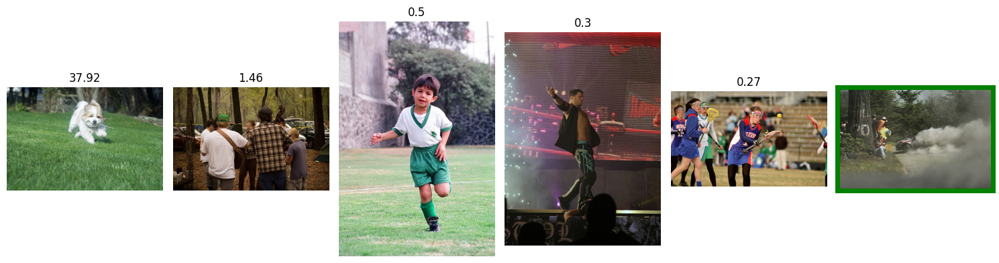

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 



-------------------- Men in a khaki-colored tent outside in a rundown area . --------------------




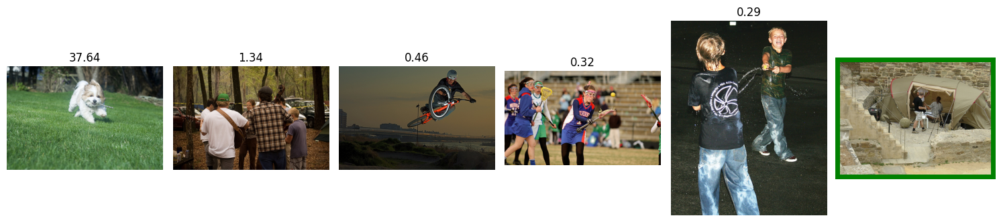



-------------------- Young boys enjoying a spray of water . --------------------



This image is unavailable in your country in compliance with local laws.





-------------------- a boy flings sand at a girl . --------------------



This image is unavailable in your country in compliance with local laws.



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 



-------------------- Two small white dogs are in a yard chasing a red ball . --------------------




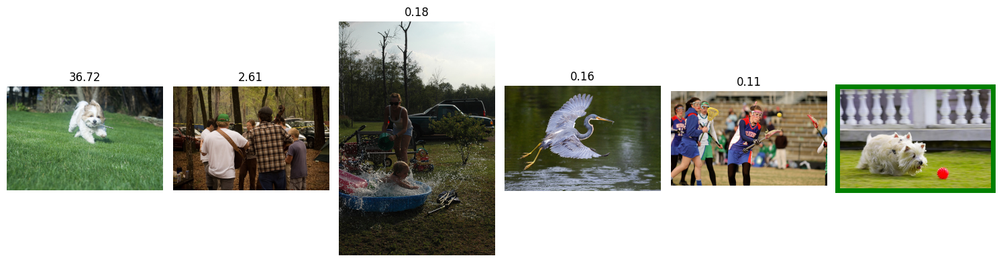

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 



-------------------- The shoppers are walking in a store . --------------------




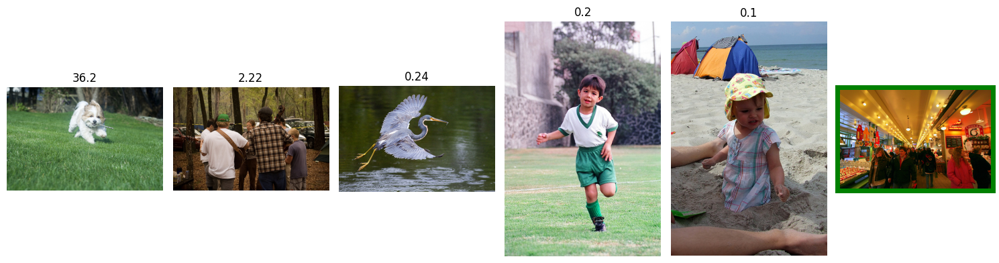



-------------------- A woman is throwing a bucket of water over a baby in the paddling pool . --------------------



This image is unavailable in your country in compliance with local laws.



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 



-------------------- A black and white dog jumping out of the water and a brown dog shaking off . --------------------




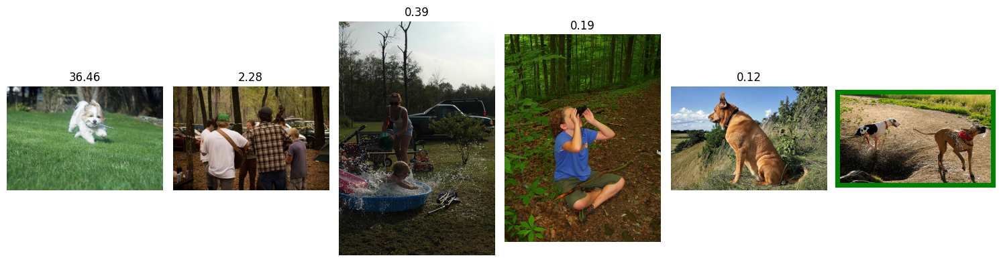



-------------------- A girl on skis in snow . --------------------



This image is unavailable in your country in compliance with local laws.





-------------------- Kids in bathing suits with water splashing around them . --------------------



This image is unavailable in your country in compliance with local laws.




In [68]:
for text in text_test:
    get_picture(text)

***Вывод:***
- Контроль юридического ограничения работает.
- Лишь в некоторых случаях в топ - 5 выдачи попадает верная картинка и, чуть чаще, попадают картинки связанные тематически. Выбранный подход не оправдал себя.
- Лучше всего справляется с поиском изображений собак. Это может быть связано с преобладанием таких изображений в исходном датасете, либо с тем, что модели проще выделить собак среди всех изображений, тк для них в описание всегда присутсвует одно и то же слово dog, когда как для людей используются man, woman, player, people, snowboarder и тд. 
- Улучшение работы сети можно добится:
        - используя больший объем данных (тысяча изображений мало для обучения)
        - использовать другую архитектуру сети.

***Альтернативное решение:***

В виду того, что результат метрики не из самых приятных (Разброс достигает 0.50, что весьма критично для нашей задачи) попрбуем применить к задаче коробочное решение: 

Существует несколько нейросетей, способных решать эту задачу. Некоторые из них:

1.  ViT (Vision Transformer) - это недавно представленная нейронная сеть, которая основана на архитектуре трансформера, обученная на задаче классификации изображений. Может использоваться для поиска картинок по тексту.

2.  CLIP (Contrastive Language-Image Pre-Training) - это обученная на задаче двухуровневое представление, которое сочетает в себе картинки и текст, за счет чего возможен поиск изображений по тексту и наоборот.

3.  DALL-E - это генеративная нейросеть, обученная на создание изображений по текстовому описанию. Может использоваться для поиска изображений по тексту.

4.  VSE++ (Visual Semantic Embedding++) - это метод обучения мульти задачам, который использует взаимодействие между изображениями и текстами для обучения смежных вложений. Может использоваться для поиска изображений по тексту.

5.  DeViSE (Deep Visual-Semantic Embedding Model) - это метод, который использует обучение мульти задачам, чтобы создать взаимосвязь между изображениями и текстом с помощью кодирования изображений и текста в общее пространство вложений. 

Воспользуемся CLIP-ViT-B/32 — это предварительно обученная модель Vision Transformer (ViT) для решения задачи машинного зрения и обработки естественного языка с использованием концепции искусственного интеллекта, разработанная OpenAI. Эта модель основана на архитектуре Transformer и использует предобученные векторные представления, которые позволяют моделировать как изображения, так и тексты. Она была создана для обработки естественого языка и изображений и предназначена для выполнения задачи joint image-text retrieval, то есть поиска связанных изображений и текстовых описаний. CLIP-ViT-B/32 обучается на огромном наборе данных, содержащем изображения и соответствующую текстовую информацию, и этот процесс занимает много времени и вычислительных ресурсов. Поэтому данный подход является одним из наиболее продвинутых методов deep learning для достижения высокой точности при решении задач машинного зрения и обработки естественного языка.

CLIP-ViT-B/32 является одним из самых мощных моделей представления изображений и текста на сегодняшний день. Она может быть использована для решения различных задач, таких как классификация изображений, распознавание объектов на изображении, обработка естественного языка, поиск похожих по смыслу изображений и текста и т.д.

Если рассматривать характеристики модели, то CLIP-ViT-B/32 имеет 32 слоя и содержит в себе 85,8 миллионов параметров. Она имеет широкий спектр приложений и может использоваться для задач классификации, обнаружения объектов, сегментации и многих других задач в области компьютерного зрения и обработки естественного языка.  



Используем библиотеку sentence-transformers с предобученным нейросетевым триплетом clip-ViT-B-32 на 400М пар изображение-описание. В данной модели эмбеддинги картинок и текста переводятся в одно векторное пространство, в котором вектора пар картинка-текст будут максимально коллинеарны друг другу.

In [69]:
# Объявляем и загружаем саму модель:

model = SentenceTransformer('clip-ViT-B-32')

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

0_CLIPModel/config.json:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

0_CLIPModel/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

0_CLIPModel/vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

0_CLIPModel/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

0_CLIPModel/tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

0_CLIPModel/preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()

  return self.fget.__get__(instance, owner)()


In [70]:
# Создадим список с путями к изображениям из тестового набора и получим эмбеддинги этих изображений:

img_names = list(glob.glob(str(Path(DATA_PATH, 'test_images', '*.jpg'))))
img_emb = model.encode([Image.open(filepath) for filepath in img_names], batch_size=16, convert_to_tensor=True, show_progress_bar=True)

Batches:   0%|          | 0/7 [00:00<?, ?it/s]

In [71]:
# Функция поиска изображения по тексту:

def search(query) -> None:

    # Проверяем легальность запроса, получаем наиболее похожие изображения, если описание среди оригинальных изображений - добавляем последнее верное'''
    
    if [i for i in get_lemmas(query) if i in BLACKLIST]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, query, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        query_emb = model.encode([query], convert_to_tensor=True, show_progress_bar=False) #получаем эмбеддинг запроса
        # Используем функцию util.semantic_search, которая вычисляет косинусную схожесть
        # между эмбеддингом запроса и всеми картинками из базы.
        # Далее функция возвращает top_k изображений с наивысшим рейтингом
        hits = util.semantic_search(query_emb, img_emb, top_k=5)[0]
        print('')
        print('-' * 20, query, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих изображений
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(hits[i]['score'], 2))
            image = Image.open(img_names[hits[i]['corpus_id']])
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if query in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальное изображение
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 3
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(DATA_PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == query].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

In [72]:
# Выбераем 10 случайных запросов из файла df_queries.

samples = df_queries.sample(10)
queries = list(samples['query_text'])
queries

['a large man dozes off on the bus .',
 'Two women on a movie set reviewing film',
 'A tennis player in a blue shirt celebrates his match .',
 'Young children shoot baskets in the field .',
 'Two children play with a white dog .',
 'Two women , one with a head bandanna , are standing next to each other while one holds a bottle .',
 'little dog is jumping up to catch a red ball in its mouth .',
 'A woman and a younger girl , both wearing blue jackets and knit caps , slide down a hill on a snow sled , a dog running at their side .',
 'Two West Highland Terriers chase a red ball .',
 'A long-haired brown and white dog carries a snowball in his mouth .']



-------------------- a large man dozes off on the bus . --------------------




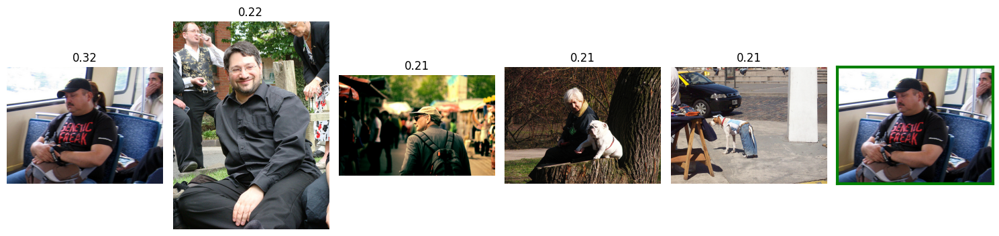



-------------------- Two women on a movie set reviewing film --------------------




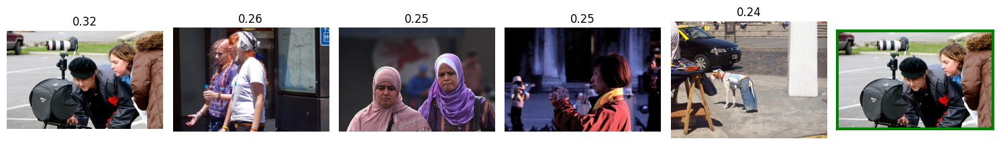



-------------------- A tennis player in a blue shirt celebrates his match . --------------------




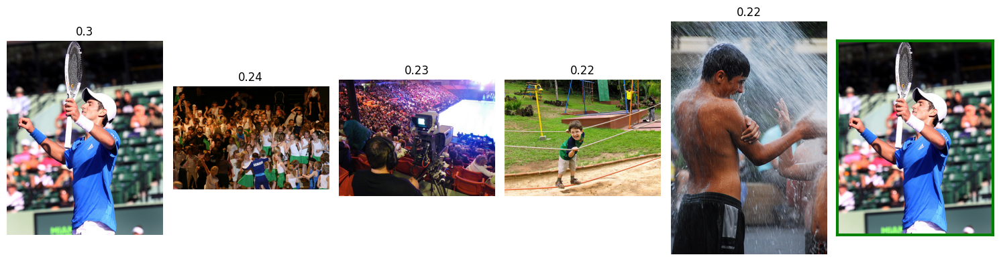



-------------------- Young children shoot baskets in the field . --------------------



This image is unavailable in your country in compliance with local laws.





-------------------- Two children play with a white dog . --------------------



This image is unavailable in your country in compliance with local laws.





-------------------- Two women , one with a head bandanna , are standing next to each other while one holds a bottle . --------------------




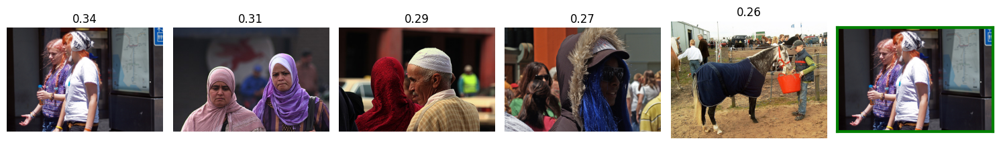



-------------------- little dog is jumping up to catch a red ball in its mouth . --------------------




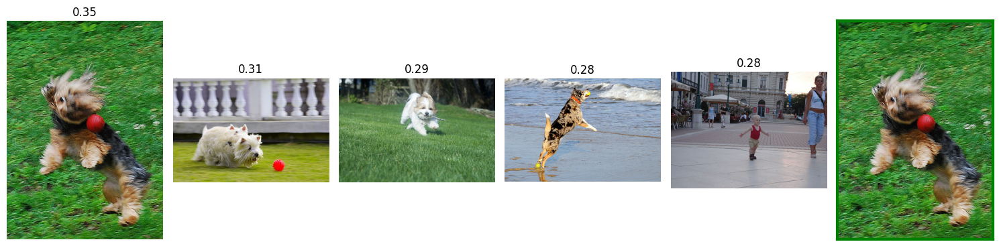



-------------------- A woman and a younger girl , both wearing blue jackets and knit caps , slide down a hill on a snow sled , a dog running at their side . --------------------



This image is unavailable in your country in compliance with local laws.





-------------------- Two West Highland Terriers chase a red ball . --------------------




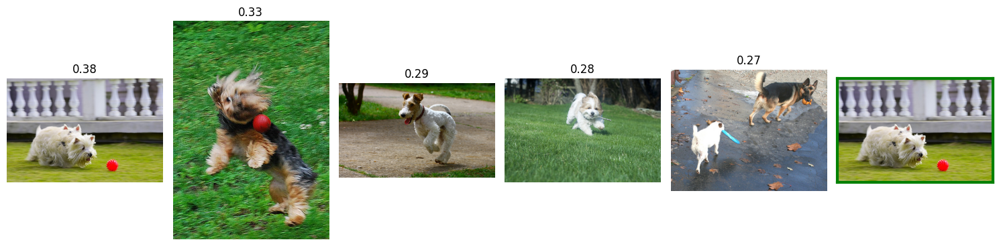



-------------------- A long-haired brown and white dog carries a snowball in his mouth . --------------------




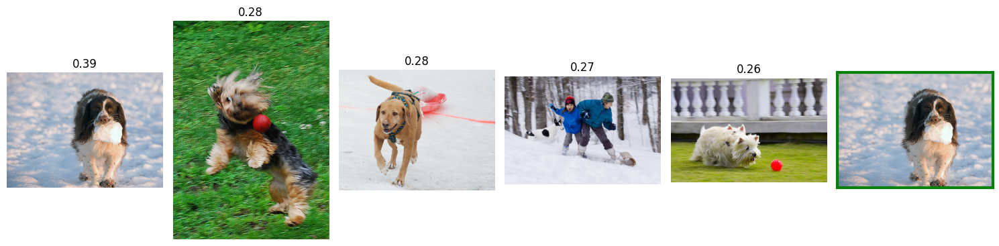

In [73]:
# Применяем функцию поиска:

for query in queries:
    search(query)

***Вывод:***   

- Как показало использование альтернативного метода самым узким местом для решения поставленной задачи является малый объем данных для обучения моделей. Предобученная нейронная сеть на большом обьеме данных справляется с нашей задачей.  
- Контроль юридического ограничения работает.
- Улучшение работы не еоробочного решения можно добиться:
        - используя больший объем данных (тысяча изображений мало для обучения).
        - использовать другую архитектуру сети.
        - в качестве метрики использовать косинусное расстояние, как в альтернативном решении.

## 8. Выводы

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска